## Paso 1: Segmentar las imagenes ya redimensionadas en 2240x2240 en 32x32

In [8]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import pandas as pd


In [9]:
from os import scandir, getcwd

#Obtenemos la lista de las imágenes a redimensionar
def lsJPG(ruta = getcwd()):
    return [arch.name for arch in scandir(ruta) if (arch.is_file() and not arch.name.endswith('.2.jpg') 
                                                    and not arch.name.endswith('0.jpg') #no cargamos la img10
                                                    and arch.name.endswith('.jpg'))] #no segmentamos las de test

listImg = lsJPG("F:\Microplasticos\MuestrasPrueba (2,3,4-11-17)\Recortada\\2240x2240")
print(listImg)

['1.jpg', '2.jpg', '3.jpg', '4.jpg', '5.jpg', '6.jpg', '7.jpg', '8.jpg', '9.jpg']


In [30]:
from os import stat, mkdir
direc = "F:\Microplasticos\MuestrasPrueba (2,3,4-11-17)\Recortada\\2240x2240\Segmentadas32x32"
try:
  stat(direc)
except:
  mkdir(direc)

In [10]:
n = int(2240/32) #70
listaRegiones = []
for img in listImg:
    recort = Image.open("MuestrasPrueba (2,3,4-11-17)/Recortada/2240x2240/"+img)
    for i in range(0,n):
        for j in range(0,n):
            region = recort.crop((i*32,j*32,i*32+32,j*32+32))
            subtring = img[0:-4]
            region.save("MuestrasPrueba (2,3,4-11-17)/Recortada/2240x2240/Segmentadas32x32/"+
                        "imgID"+subtring+"-R"+str(i)+"C"+str(j)+".jpg")
            listaRegiones.append("imgID"+subtring+"-R"+str(i)+"C"+str(j))

len(listaRegiones)

44100

## Paso 2: Cargar todos los CSV mapeados con el programa auxiliar de Java y concatenarlos

In [3]:
import pandas as pd

In [11]:
#Vamos a cargar todos los CSV creados por el Programa de Java para mapear las imágenes.
def lsCSV(ruta = getcwd()):
    return[arch.name for arch in scandir(ruta) if (arch.is_file() and arch.name.endswith('.csv')
                                                   and not arch.name.endswith('TODOS.csv'))]

listCSV = lsCSV("F:\Microplasticos\MuestrasPrueba (2,3,4-11-17)\Recortada\\2240x2240\CSV 32x32 Java")
print(listCSV)

['DatosImg1Seg32.csv', 'DatosImg2Seg32.csv', 'DatosImg3Seg32.csv', 'DatosImg4Seg32.csv', 'DatosImg5Seg32.csv', 'DatosImg6Seg32.csv', 'DatosImg7Seg32.csv', 'DatosImg8Seg32.csv', 'DatosImg9Seg32.csv']


In [13]:
#Concatenamos todos los CSV y obtenemos el mapeado de todas las imagenes en un mismo dataframe
dfConcat = pd.read_csv("MuestrasPrueba (2,3,4-11-17)/Recortada/2240x2240/CSV 32x32 Java/" + listCSV[0])
for i in listCSV[1:]:
    dfNew = pd.read_csv("MuestrasPrueba (2,3,4-11-17)/Recortada/2240x2240/CSV 32x32 Java/" + i)
    dfConcat = pd.concat([dfConcat,dfNew],ignore_index=True)

dfConcat.count()

Nombre Segmento    44100
Plasticos          44100
dtype: int64

## Paso 3: Visualizar las diferencias de las distintas clases

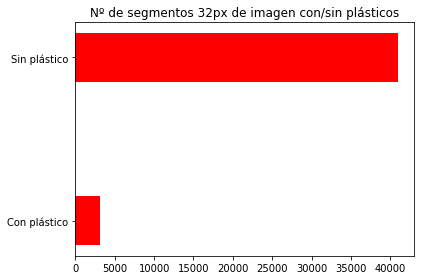

Imágenes a las que hay que hacer data augmentation:  3144
Imágenes sin plasticos:  40956


In [14]:
def visualizarClases(dfConcat):
    #Contamos cuantos fragmentos tenemos con/sin plásticos
    unos = dfConcat[dfConcat['Plasticos'] == 1].count()
    ceros = dfConcat[dfConcat['Plasticos'] == 0].count()

    #Graficos de barras bonicos ---> https://plot.ly/matplotlib/bar-charts/
    plt.barh(["Con plástico","Sin plástico"],[unos.values[0],ceros.values[0]],color="red",height=0.3)
    plt.title("Nº de segmentos 32px de imagen con/sin plásticos")
    plt.tight_layout() #Evitamos que se corten las leyendas del gráfico con size también se arregla
    plt.savefig("NSegmentosImg-32px.jpg", pad_inches=30)
    plt.show()
    
    print("Imágenes a las que hay que hacer data augmentation: ", unos[0])
    print("Imágenes sin plasticos: ", ceros[0])
    
visualizarClases(dfConcat)

Lista de nº de plasticos por img:  [116, 62, 787, 530, 321, 640, 416, 202, 70]


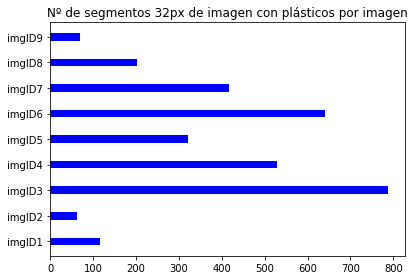

In [15]:
#Cantidad de unos por imagen
startName = ['imgID1','imgID2','imgID3','imgID4','imgID5','imgID6','imgID7','imgID8','imgID9']
imgInt = []
for i in startName:
    imgAux = dfConcat[dfConcat['Nombre Segmento'].str.startswith(i)]
    imgInt.append(imgAux[imgAux['Plasticos'] == 1].count()[0])

print("Lista de nº de plasticos por img: ", imgInt)    

#Grafico para ver la cantidad de pástico que hay por imagen
plt.barh(startName,imgInt, color="blue",height=0.3)
plt.title("Nº de segmentos 32px de imagen con plásticos por imagen")
plt.tight_layout() 
plt.savefig("NSegmentosPorImg-32px.jpg")
plt.show()

## Paso 4: Hacer data augmentation de los segmentos con plástico

Usaremos la siguiente función con las distintas rotaciones y trasformaciones para aumentar los datos de aquellos segmentos que tengan plástico.<br/>
**Image.transpose(method)**<br/>
method – Possible values of method are:<br/>
PIL.Image.FLIP_LEFT_RIGHT<br/>
PIL.Image.FLIP_TOP_BOTTOM<br/>
PIL.Image.ROTATE_90<br/>
PIL.Image.ROTATE_180<br/>
PIL.Image.ROTATE_270<br/>
PIL.Image.TRANSPOSE or PIL.Image.TRANSVERSE.<br/>

In [18]:
#Bucle for para realizar el Data Augmentation
listPlastico = dfConcat[dfConcat['Plasticos'] == 1]['Nombre Segmento'].tolist()
listNewImg = []
for i in listPlastico:
    imagenOriginal = Image.open("MuestrasPrueba (2,3,4-11-17)/Recortada/2240x2240/Segmentadas32x32/"+i+".jpg")

    imagen90 = imagenOriginal.transpose(Image.ROTATE_90)
    listNewImg.append(i[:5] +"a"+ i[5:])
    imagen90.save("MuestrasPrueba (2,3,4-11-17)/Recortada/2240x2240/Segmentadas32x32/"+i[:5] +"a"+ i[5:]+".jpg")
    imagen180 = imagenOriginal.transpose(Image.ROTATE_180)
    listNewImg.append(i[:5] +"b"+ i[5:])
    imagen180.save("MuestrasPrueba (2,3,4-11-17)/Recortada/2240x2240/Segmentadas32x32/"+i[:5] +"b"+ i[5:]+".jpg")
    imagen270 = imagenOriginal.transpose(Image.ROTATE_270)
    listNewImg.append(i[:5] +"c"+ i[5:])
    imagen270.save("MuestrasPrueba (2,3,4-11-17)/Recortada/2240x2240/Segmentadas32x32/"+i[:5] +"c"+ i[5:]+".jpg")
    
    imagenTOPMirror = imagenOriginal.transpose(Image.FLIP_TOP_BOTTOM)
    listNewImg.append(i[:5] +"d"+ i[5:])
    imagenTOPMirror.save("MuestrasPrueba (2,3,4-11-17)/Recortada/2240x2240/Segmentadas32x32/"
                         +i[:5] +"d"+ i[5:]+".jpg")
    imagenLEFTMirror = imagenOriginal.transpose(Image.FLIP_LEFT_RIGHT)
    listNewImg.append(i[:5] +"e"+ i[5:])
    imagenLEFTMirror.save("MuestrasPrueba (2,3,4-11-17)/Recortada/2240x2240/Segmentadas32x32/"
                          +i[:5] +"e"+ i[5:]+".jpg")
    
    imagenTRANSVERSE = imagenOriginal.transpose(Image.TRANSVERSE)
    listNewImg.append(i[:5] +"f"+ i[5:])
    imagenTRANSVERSE.save("MuestrasPrueba (2,3,4-11-17)/Recortada/2240x2240/Segmentadas32x32/"
                          +i[:5] +"f"+ i[5:]+".jpg")
    imagenTRANSPOSE = imagenOriginal.transpose(Image.TRANSPOSE)
    listNewImg.append(i[:5] +"g"+ i[5:])
    imagenTRANSPOSE.save("MuestrasPrueba (2,3,4-11-17)/Recortada/2240x2240/Segmentadas32x32/"
                         +i[:5] +"g"+ i[5:]+".jpg")

print(len(listNewImg))

22008


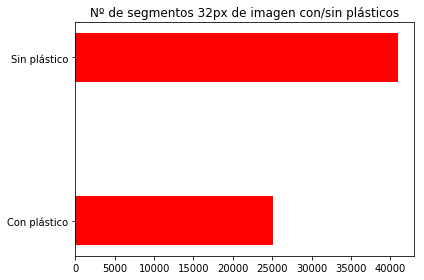

Imágenes a las que hay que hacer data augmentation:  25152
Imágenes sin plasticos:  40956


Nombre Segmento    66108
Plasticos          66108
dtype: int64

In [19]:
listNewImgUnos = np.ones(len(listNewImg),dtype=int)
dframe = pd.DataFrame({"Nombre Segmento":listNewImg, "Plasticos":listNewImgUnos}) 
dframe = pd.concat([dfConcat,dframe],ignore_index=True)

visualizarClases(dframe)
dframe.count()

#Guardamos el DataFrame con el data augmentation
dframe.to_csv("MuestrasPrueba (2,3,4-11-17)/Recortada/2240x2240/CSV 32x32 Java/DatosImgTODOS.csv", header=True, index=False)

Como la diferencia entre clases sigue siendo bastante grande vamos a cortar de forma aleatoria los segmentos sin plastico hasta igualar a los de con plastico

In [20]:
import random

In [21]:
unosList = dframe[dframe['Plasticos'] == 1]['Nombre Segmento'].tolist()
cerosList = dframe[dframe['Plasticos'] == 0]['Nombre Segmento'].tolist()
print("Imágenes con plásticos: ", len(unosList))
print("Imágenes sin plásticos: ", len(cerosList))

random.shuffle(cerosList)
random.shuffle(unosList)
cerosList = cerosList[:len(unosList)]
print("Ahora igualamos el nº de elementos: \ncerosList = ", len(cerosList))

Imágenes con plásticos:  25152
Imágenes sin plásticos:  40956
Ahora igualamos el nº de elementos: 
cerosList =  25152


In [22]:
from sklearn.model_selection import train_test_split
x = unosList + cerosList
y = np.concatenate([np.ones((len(unosList),),dtype=int),np.zeros((len(cerosList),),dtype=int)])

# Con stratify=y nos aseguramos que se mantenga la proporción 50% 50%
X_trainList, X_testList, Y_train, Y_test = train_test_split(x, y, test_size = 0.3, random_state = 0, stratify=y)
print("xTrain: ", len(X_trainList), " xTest: ", len(X_testList))
print("yTrain: ", len(Y_train))
print(Y_train[0:50])
print("yTest : ", len(Y_test))
print(Y_test[0:50])
print("Como podemos observar los 0's y 1's están intercalados")

xTrain:  35212  xTest:  15092
yTrain:  35212
[0 1 1 1 1 0 1 0 0 1 0 1 1 0 0 0 0 0 1 1 1 0 0 0 1 1 1 1 0 0 0 1 0 0 1 0 1
 0 1 1 0 0 0 1 0 1 1 1 1 0]
yTest :  15092
[0 0 1 1 0 1 1 1 0 0 0 1 0 0 1 1 0 1 0 1 0 0 0 1 1 1 1 1 0 1 1 1 0 0 0 1 1
 0 1 0 0 0 1 1 0 1 1 0 1 1]
Como podemos observar los 0's y 1's están intercalados


## Paso 5: Preparación y entrenamiento de la red neuronal básica utilizada en la Prueba 4

In [23]:
#Array con todas las imágenes a entrenar
X_train = np.array([np.array(Image.open("MuestrasPrueba (2,3,4-11-17)/Recortada/2240x2240/Segmentadas32x32/"+img + ".jpg")) for img in X_trainList] )
print(X_train.shape)
X_test = np.array([np.array(Image.open("MuestrasPrueba (2,3,4-11-17)/Recortada/2240x2240/Segmentadas32x32/"+img + ".jpg")) for img in X_testList] )
print(X_test.shape)

(35212, 32, 32, 3)
(15092, 32, 32, 3)


In [24]:
#Normalizamos la imagen
X_train= X_train / 255.0
X_test= X_test / 255.0
print(X_train.shape)
print(X_test.shape)

(35212, 32, 32, 3)
(15092, 32, 32, 3)


### Paso 5.1: Entrenamiento de la red 

In [3]:
from keras.models                import Sequential, Model
from keras.layers                import Dense, Input, Conv2D, MaxPool2D, Flatten, BatchNormalization, Dropout
from keras.layers                import Conv2DTranspose, UpSampling2D, MaxPooling2D, Reshape, Activation, ReLU
from keras.preprocessing.image   import ImageDataGenerator
from keras.utils                 import to_categorical
from keras.optimizers            import SGD
from keras.callbacks             import ModelCheckpoint, LearningRateScheduler

D:\Anaconda3\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [4]:
#Entrenaremos con el mismo modelo que en la prueba4
model = Sequential()
model.add(Conv2D(16, (3, 3), input_shape=(32, 32,3)))
model.add(MaxPooling2D(pool_size=(2, 2))) #Comprimir la info y hacer que sea menos propensa a errores de traslaciones
model.add(Activation('relu'))

model.add(Conv2D(64, (3, 3)))
model.add(MaxPooling2D(pool_size=(2, 2))) #Comprimir la info y hacer que sea menos propensa a errores de traslaciones
model.add(Activation('relu'))

model.add(Flatten())  
model.add(Dense(128, activation='relu'))
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy']) 

In [33]:
#Hacemos un checkpoint para que el modelo se guarde despues de cada epoch solo si el val_loss ha mejorado
model_checkpoint = ModelCheckpoint('Segmentation32x32RedPesos.hdf5', monitor='val_loss',verbose=1, save_best_only=True)
model.fit(X_train, Y_train,  batch_size=32, validation_data=[X_test, Y_test], epochs=10, callbacks=[model_checkpoint])

Train on 35212 samples, validate on 15092 samples
Epoch 1/10
35212/35212 [==============================] - 55s 2ms/step - loss: 0.2906 - acc: 0.8776 - val_loss: 0.2352 - val_acc: 0.9113

Epoch 00001: val_loss improved from inf to 0.23515, saving model to Segmentation32x32RedPesos.hdf5
Epoch 2/10
35212/35212 [==============================] - 54s 2ms/step - loss: 0.1922 - acc: 0.9323 - val_loss: 0.1989 - val_acc: 0.9253

Epoch 00002: val_loss improved from 0.23515 to 0.19890, saving model to Segmentation32x32RedPesos.hdf5
Epoch 3/10
35212/35212 [==============================] - 53s 2ms/step - loss: 0.1618 - acc: 0.9424 - val_loss: 0.1535 - val_acc: 0.9470

Epoch 00003: val_loss improved from 0.19890 to 0.15352, saving model to Segmentation32x32RedPesos.hdf5
Epoch 4/10
35212/35212 [==============================] - 53s 2ms/step - loss: 0.1411 - acc: 0.9506 - val_loss: 0.1547 - val_acc: 0.9441

Epoch 00004: val_loss did not improve from 0.15352
Epoch 5/10
35212/35212 [==================

In [6]:
#Cargamos los pesos del modelo
model.load_weights('Segmentation32x32RedPesos.hdf5')   

In [35]:
from sklearn.metrics import confusion_matrix

pv =  np.ravel(model.predict(X_test))
pv_round = np.asarray([int(round(i)) for i in pv])
conf_mat = confusion_matrix(Y_test, pv_round)
conf_mat

array([[7261,  285],
       [ 497, 7049]], dtype=int64)

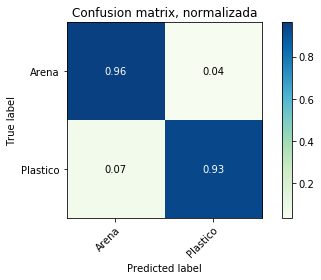

In [36]:
def matrixConfusion (conf_mat, cmap):
    
    conf_mat = conf_mat.astype('float') / conf_mat.sum(axis=1)[:, np.newaxis]
    fig, ax = plt.subplots()
    im = ax.imshow(conf_mat, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(conf_mat.shape[1]),
            yticks=np.arange(conf_mat.shape[0]),
            xticklabels=["Arena","Plastico"], yticklabels=["Arena","Plastico"],
            title='Confusion matrix, normalizada',
            ylabel='True label',
            xlabel='Predicted label')
    
    # Rotate the tick labels and set their alignment.    
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
                 rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f'
    thresh = conf_mat.max() / 2.
    for i in range(conf_mat.shape[0]):
        for j in range(conf_mat.shape[1]):
            ax.text(j, i, format(conf_mat[i, j], fmt),
                    ha="center", va="center",
                    color="white" if conf_mat[i, j] > thresh else "black")
    fig.tight_layout()
    plt.savefig("MatrizConfusion-32px.jpg")
    
    plt.show()
    
matrixConfusion(conf_mat,'GnBu')

## Paso 6: Crear un Modelo de Regresión Lineal para estimar la cantidad de plastico en gramos

In [16]:
#Datos calculados en celdas superiores
print("Lista de nº de plasticos por img en segmentos de 32x32, empezando en imgID1: ", imgInt)

#Ahora vamos a obtener la lista con los datos en gramos a partir de un csv
df = pd.read_excel("MuestrasPrueba (2,3,4-11-17)/Recortada/Excel datos-fotos formateado.xlsx")
df.head(9)

Lista de nº de plasticos por img en segmentos de 32x32, empezando en imgID1:  [116, 62, 787, 530, 321, 640, 416, 202, 70]


,ID,Replica,Fecha,Foto,Peso muestra(g),Nº fibras/Lines,Nº Fragm.,Nº films,Nº pellest,Nº EPS/XPS/Foams,...,Nº fibras/Lines.1,Nº baston.,Nº EPS/XPS/Foams.1,Nº Colillas,Nº Films,Otros.1,Nº total (5-25 mm),Peso tot. (5-25 mm) [mg],Nº total items,Peso total items (mg)
0,1,A,2017-11-02,1-Bocabarranco-recortada,-,0,1,4,0,37,...,0,0,2,1,0,0,7,794.0,50,840.3
1,2,B,2017-11-02,2-Bocabarranco-recortada,-,0,0,0,0,20,...,0,0,1,1,0,1,5,550.3,30,631.5
2,3,C,2017-11-02,3-Bocabarranco-recortada,-,0,50,5,21,127,...,1,2,11,5,0,3,42,5593.5,246,7546.6
3,4,A,2017-11-03,4-Cicer-recortada,-,3,217,3,24,119,...,0,1,0,0,1,3,43,5985.4,419,10753.6
4,5,B,2017-11-03,5-Cicer-recortada,-,0,145,0,12,89,...,0,0,0,0,0,1,31,2738.8,280,4877.3
5,6,C,2017-11-03,6-Cicer-recortada,-,0,415,2,27,295,...,0,1,2,0,2,2,76,6337.8,822,12463.2
6,7,A,2017-11-04,7-Cuervitos-recortada,575,1,562,1,3,42,...,2,0,0,0,0,2,15,455.0,631,2775.8
7,8,B,2017-11-04,8-Cuervitos-recortada,819,0,332,1,0,21,...,1,1,0,0,0,2,19,997.7,375,2401.5
8,9,C,2017-11-04,9-Cuervitos-recortada,723,0,55,1,1,8,...,0,0,0,0,0,0,0,0.0,66,441.7


In [39]:
itemsTotal = df['Peso total items (mg)'].tolist()
pesoGr = itemsTotal[0:9]
pesoGr = np.asarray(pesoGr)/100
print("Peso en gr de la cantidad de plástico que hay por imágen: ", pesoGr)

print("Coeficiente de correlación:\n", np.corrcoef(imgInt,pesoGr))

Peso en gr de la cantidad de plástico que hay por imágen:  [  8.403   6.315  75.466 107.536  48.773 124.632  27.758  24.015   4.417]
Coeficiente de correlación:
 [[1.         0.84924099]
 [0.84924099 1.        ]]


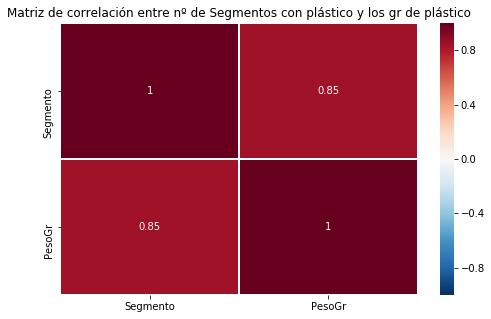

In [40]:
import seaborn as sb

plt.subplots(figsize=(8,5))
plt.title("Matriz de correlación entre nº de Segmentos con plástico y los gr de plástico")
sb.heatmap(np.corrcoef(imgInt,pesoGr),vmin=-1, vmax=1, cmap="RdBu_r", annot=True, linewidths=.5,
           xticklabels= ["Segmento","PesoGr"], yticklabels=["Segmento","PesoGr"])

plt.savefig("MatrizCorrelacion-32px.jpg")
plt.show()



In [41]:
from sklearn import linear_model
from sklearn.metrics import mean_squared_error

nPlast =  np.asarray(imgInt)[:, np.newaxis]
regr = linear_model.LinearRegression().fit(nPlast,pesoGr)

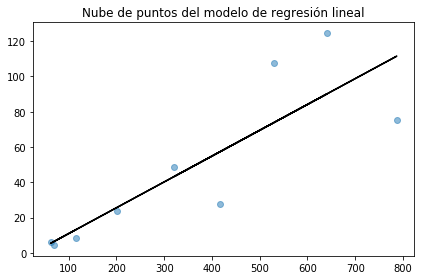

Error cuadrático medio:  506.765


In [42]:
plt.scatter(nPlast,pesoGr, alpha= 0.5)
plt.plot(nPlast,regr.predict(nPlast),color="black")
#Al intentar poner los xlabel e ylabel da error con las strings
plt.title("Nube de puntos del modelo de regresión lineal")
plt.tight_layout() 
plt.savefig("RegresionLineal-32px.jpg")
plt.show()

print("Error cuadrático medio: ", round(mean_squared_error(pesoGr,regr.predict(nPlast)),3))

## Paso 7: Comprobar los resultados con otras imágenes

### Paso 7.1: Redimensionar las imágenes de testeo

In [86]:
#Obtenemos la lista de las imágenes a redimensionar
def lsJPGTest(ruta = getcwd()):
    return [arch.name for arch in scandir(ruta) if (arch.is_file()  
                                                    and arch.name.startswith('20')
                                                    and arch.name.endswith('.jpg'))]

listImgTest = lsJPGTest("F:\Microplasticos\MuestrasPrueba (2,3,4-11-17)\Recortada")
print(listImgTest)

['20151127_Lambra_c.jpg', '20160201_Lambra_c.jpg']


In [ ]:
for img in listImgTest:
    redim = Image.open("MuestrasPrueba (2,3,4-11-17)/Recortada/"+img)
    nuevo = redim.resize((2240, 2240), Image.ANTIALIAS)
    nuevo.save("MuestrasPrueba (2,3,4-11-17)/Recortada/2240x2240/"+img)

### Paso 7.2: Segmentar las imágenes de testeo

In [87]:
from os import stat, mkdir
direc = "F:\Microplasticos\MuestrasPrueba (2,3,4-11-17)\Recortada\\2240x2240\TestImg Segmentadas32x32"
try:
  stat(direc)
except:
  mkdir(direc)

In [88]:
n = int(2240/32) #70

for img in listImgTest:
    recort = Image.open("MuestrasPrueba (2,3,4-11-17)/Recortada/2240x2240/"+img)
    for i in range(0,n):
        for j in range(0,n):
            region = recort.crop((i*32,j*32,i*32+32,j*32+32))
            subtring = img[0:-4]
            region.save("MuestrasPrueba (2,3,4-11-17)/Recortada/2240x2240/TestImg Segmentadas32x32/"+
                        "imgID"+subtring+"-R"+str(i)+"C"+str(j)+".jpg")

In [89]:
#Obtenemos una lista con todos los elementos en la carpeta nueva
def lsImg1(ruta = getcwd()):
    return [arch.name for arch in scandir(ruta) if (arch.is_file() and arch.name.startswith('imgID20151127_Lambra_c'))]

listSegTest1 = lsImg1("F:\Microplasticos\MuestrasPrueba (2,3,4-11-17)\Recortada\\2240x2240\TestImg Segmentadas32x32")

def lsImg2(ruta = getcwd()):
    return [arch.name for arch in scandir(ruta) if (arch.is_file() and arch.name.startswith('imgID20160201_Lambra_c'))]

listSegTest2 = lsImg2("F:\Microplasticos\MuestrasPrueba (2,3,4-11-17)\Recortada\\2240x2240\TestImg Segmentadas32x32")

### Paso 7.3: Evaluar la red con las dos imágenes de testeo

In [90]:
img_test1 = np.array([np.array(Image.open("MuestrasPrueba (2,3,4-11-17)/Recortada/2240x2240/TestImg Segmentadas32x32/"+img)) for img in listSegTest1] )
print(img_test1.shape)

img_test2 = np.array([np.array(Image.open("MuestrasPrueba (2,3,4-11-17)/Recortada/2240x2240/TestImg Segmentadas32x32/"+img)) for img in listSegTest2] )
print(img_test2.shape)

(4900, 32, 32, 3)
(4900, 32, 32, 3)


In [91]:
#Normalizamos las imagenes
img_test1= img_test1 / 255.0
img_test2= img_test2 / 255.0
print(img_test1.shape)
print(img_test2.shape)

(4900, 32, 32, 3)
(4900, 32, 32, 3)


In [92]:
pv_test_img1=  np.ravel(model.predict(img_test1))
pv_test_img1 = np.asarray([int(round(i)) for i in pv_test_img1])

pv_test_img2=  np.ravel(model.predict(img_test2))
pv_test_img2 = np.asarray([int(round(i)) for i in pv_test_img2])

### Paso 7.4: Predecimos la cantidad de microplasticos en cada imagen

In [93]:
dfTest = pd.read_csv("MuestrasPrueba (2,3,4-11-17)/Recortada/ImgTest-Datos.csv", sep =';')
dfTest

,Nombre Img,Date,Location,Replicate,total debris (gr/m2),micro debris (gr/m2),meso debris (gr/m2)
0,20151127_Lambra_c,27/11/2015,Lambra,C,"135,09","69,7448","65,3452"
1,20160201_Lambra_c,01/02/2016,Lambra,C,"71,924","47,0436","24,8804"


In [98]:
totalDebris1 = dfTest["total debris (gr/m2)"].iloc[0].replace(",",".")
print(totalDebris1)
totalDebris2 = dfTest["total debris (gr/m2)"].iloc[1].replace(",",".")
print(totalDebris2)

135.09
71.924


In [100]:
#Contamos el numero de segmentos que tienen 1.
counter_test_img1 = np.count_nonzero(pv_test_img1)
counter_test_img2 = np.count_nonzero(pv_test_img2)
regrTest1 = regr.predict(counter_test_img1)
regrTest2 = regr.predict(counter_test_img2)

print("Para los n segmentos = ",counter_test_img1 ," se estima unos ", regrTest1, "gr", "La respuesta correcta es: ", totalDebris1)
print("Para los n segmentos = ",counter_test_img2 ," se estima unos ", regrTest2, "gr", "La respuesta correcta es: ", totalDebris2)

Para los n segmentos =  1729  se estima unos  [249.43103885] gr La respuesta correcta es:  135.09
Para los n segmentos =  2896  se estima unos  [420.25310505] gr La respuesta correcta es:  71.924


Si visualizamos la 2º imagen podremos observar que está detectando todas las zonas de arena sombreada como plastico. Para mejores resultados habría que asegurarse de que en el conjunto de entrenamiento hubiera arena sombreada. 

## Paso 8: Testeo con 50 imágenes

### Paso 8.1: Redimensionar las imágenes de testeo 2240x2240


In [17]:
listImgTest = lsJPG("F:\Microplasticos\MuestrasPrueba (2,3,4-11-17)\Recortada\\test")
print(listImgTest)

['20151115_Lambra_a.jpg', '20151115_Lambra_b.jpg', '20151115_Lambra_c.jpg', '20151125_Famara_a.jpg', '20151125_Famara_b.jpg', '20151125_Famara_c.jpg', '20151127_Lambra_a.jpg', '20151127_Lambra_b.jpg', '20151127_Lambra_c.jpg', '20151211_Lambra_a.jpg', '20151211_Lambra_b.jpg', '20151211_Lambra_c.jpg', '20151212_Famara_a.jpg', '20151212_Famara_b.jpg', '20151212_Famara_c.jpg', '20151221_Famara_a.jpg', '20151221_Famara_b.jpg', '20151221_Famara_c.jpg', '20151222_Lambra_a.jpg', '20151222_Lambra_b.jpg', '20151222_Lambra_c.jpg', '20160118_Famara_a.jpg', '20160118_Famara_b.jpg', '20160118_Famara_c.jpg', '20160129_Famara_a.jpg', '20160129_Famara_b.jpg', '20160129_Famara_c.jpg', '20160201_Lambra_a.jpg', '20160201_Lambra_b.jpg', '20160201_Lambra_c.jpg', '20160308_Famara_a.jpg', '20160308_Famara_b.jpg', '20160308_Famara_c.jpg', '20160324_Famara_a.jpg', '20160324_Famara_b.jpg', '20160326_Lambra_a.jpg', '20160326_Lambra_b.jpg', '20160326_Lambra_c.jpg', '20160411_Lambra_a.jpg', '20160411_Lambra_b.jpg',

In [68]:
len(listImgTest)

52

In [133]:
#Redimensionamos todas las imagenes a 2240x2240
for img in listImgTest:
    redim = Image.open("MuestrasPrueba (2,3,4-11-17)/Recortada/test/"+img)
    nuevo = redim.resize((2240, 2240), Image.ANTIALIAS)
    nuevo.save("MuestrasPrueba (2,3,4-11-17)/Recortada/2240x2240/test/"+img)

### Paso 8.2: Segmentar las imágenes 

In [176]:
a = 5
"{0:0=2d}".format(a)

'05'

Vamos a poner la nomenclatura de los nombres bien para poder ordenarlos de forma adecuada a la hora de la visualización de las imagenes segmentadas.

In [18]:
n = int(2240/32) #70
listaRegionesTest = []
for img in listImgTest:
    recort = Image.open("MuestrasPrueba (2,3,4-11-17)/Recortada/2240x2240/test/"+img)
    for i in range(0,n):
        for j in range(0,n):
            region = recort.crop((i*32,j*32,i*32+32,j*32+32))
            subtring = img[0:-4]
            region.save("MuestrasPrueba (2,3,4-11-17)/Recortada/2240x2240/TestImg Segmentadas32x32/"+
                        "imgID-"+subtring+"-R"+"{0:0=2d}".format(i)+"C"+"{0:0=2d}".format(j)+".jpg")
            listaRegionesTest.append("imgID-"+subtring+"-R"+"{0:0=2d}".format(i)+"C"+"{0:0=2d}".format(j))

len(listaRegionesTest)

254800

### Paso 8.3: Evaluar la cada imágen individualmente con la red. 

In [19]:
def lsTestIMG(imgName, ruta = getcwd()):
    return [arch.name for arch in scandir(ruta) if (arch.is_file() and arch.name.endswith('.jpg') 
                                                    and arch.name.startswith(imgName[0:-4]))] 

prueba = [ np.asarray(lsTestIMG("imgID-"+i,"F:\Microplasticos\MuestrasPrueba (2,3,4-11-17)\Recortada\\2240x2240\TestImg Segmentadas32x32")) for i in listImgTest]


In [179]:
print(listImgTest[0])
print(prueba[0])
print(70*70)
print(len(prueba[0]))

20151115_Lambra_a.jpg
['imgID-20151115_Lambra_a-R00C00.jpg' 'imgID-20151115_Lambra_a-R00C01.jpg'
 'imgID-20151115_Lambra_a-R00C02.jpg' ...
 'imgID-20151115_Lambra_a-R69C67.jpg' 'imgID-20151115_Lambra_a-R69C68.jpg'
 'imgID-20151115_Lambra_a-R69C69.jpg']
4900
4900


In [34]:
#Array con todas las imágenes cargadas

imgTestArray = np.array([np.array(Image.open("MuestrasPrueba (2,3,4-11-17)/Recortada/2240x2240/TestImg Segmentadas32x32/"+img)) for img in prueba[0]])[np.newaxis,:]
print(imgTestArray.shape)
for ele in prueba[1:]:
    aux = np.array([np.array(Image.open("MuestrasPrueba (2,3,4-11-17)/Recortada/2240x2240/TestImg Segmentadas32x32/"+img)) for img in ele])[np.newaxis,:]
    imgTestArray = np.vstack((imgTestArray,aux))

print(imgTestArray.shape)

(1, 4900, 32, 32, 3)
(52, 4900, 32, 32, 3)


Así nos aseguramos que las primeras 4900 imágenes sea de la imagen 1

In [35]:
#Normalizamos
imgTestArray = imgTestArray / 255.0
print(imgTestArray.shape)

(52, 4900, 32, 32, 3)


Creamos un array donde almacenar los resultados de las evaluaciones

In [36]:
testEval = np.zeros((imgTestArray.shape[0], n*n))
print(testEval.shape)

(52, 4900)


In [37]:
for i in range(0,imgTestArray.shape[0]):
    aux =  np.ravel(model.predict(imgTestArray[i]))
    testEval[i] = np.asarray([int(round(i)) for i in aux])

print(testEval.shape)

(52, 4900)


### Paso 8.4: Ver la estimación de plástico con el modelo de regresión lineal

In [43]:
eval_counter_test = np.asarray([np.count_nonzero(i) for i in testEval])
print(eval_counter_test)
eval_regr_test = np.ravel(np.asarray([regr.predict(i) for i in eval_counter_test]))
print(eval_regr_test)

[4217 1759 3859  358  290  647 2970 2659 1830 2541 2698 1322 1289 2125
  877  859  483  742 3316 2703 3130 1285 1049  831  213  291  469  542
  519  564  576 1187 2373 2690 2613  720  169  228 1172 1248 1036 1643
 1522 1518  511  292  830  614  633  794 3479  505]
[613.6172434  253.8223516  561.21424451  48.74804591  38.79440366
  91.05102546 431.08500985 385.56173428 264.21512513 368.28923744
 391.27044086 189.85556246 185.02511843 307.39636723 124.71775658
 122.08296893  67.04518239 104.95684918 481.73148363 392.00232632
 454.50534455 184.43961006 149.89461638 117.98441036  27.52336759
  38.94078075  64.9959031   75.68143081  72.3147577   78.90172683
  80.65825193 170.09465506 343.69788601 390.09942413 378.82838805
 101.73655316  21.08277555  29.71902397 167.89899868 179.02365766
 147.99171419 236.84260895 219.13098083 218.54547247  71.14374096
  39.08715784 117.83803327  86.22058142  89.00174617 112.56845796
 505.59094961  70.26547841]


Ahora cargamos el CSV para comparar los datos predecidos frente a los datos originales. 

In [44]:
dataframeTest = pd.read_excel("F:\Microplasticos\Fotos+peso Alicia\Fotos_peso.xlsx")
dataframeTest.head()

,date,location,replicate,total debris (gr/m2),micro debris (gr/m2),meso debris (gr/m2),PHOTO ID,Unnamed: 7,Unnamed: 8,Unnamed: 9
0,2015-11-15,Lambra,A,15.4068,8.6312,6.7756,20151115_Lambra_a,NaN,NaN,NaN
1,2015-11-15,Lambra,B,13.8632,6.0224,7.8408,20151115_Lambra_b,NaN,NaN,NaN
2,2015-11-15,Lambra,C,9.1304,4.6848,4.4456,20151115_Lambra_c,NaN,Labels,NaN
3,2015-11-25,Famara,A,16.0908,14.1920,1.8988,20151125_Famara_a,NaN,NaN,NaN
4,2015-11-25,Famara,B,17.3656,13.6692,3.6964,20151125_Famara_b,NaN,NaN,NaN


In [45]:
orig_excel_test = np.zeros(len(eval_regr_test))

for i in range(0,len(listImgTest)):
    orig_excel_test[i] = dataframeTest[dataframeTest["PHOTO ID"] == listImgTest[i][0:-4]]["total debris (gr/m2)"].values

#Si la sentencia fuera escrita en una linea....
#orig_excel_test  = np.asarray([dataframeTest[dataframeTest["PHOTO ID"] == listImgTest[i][0:-4]]["total debris (gr/m2)"].values for i in range(0,len(listImgTest))])  

print(orig_excel_test)
print(len(orig_excel_test))

[ 15.4068  13.8632   9.1304  16.0908  17.3656  32.404  137.4036  91.2496
 135.09    67.2556  79.0984 104.5004  36.7044  57.3532  22.0656  20.3876
  17.2908  24.9376  35.8028  69.984   47.0544   7.1712  13.1476  16.794
  32.84     8.6236  22.1512  31.766   32.2576  71.924    7.5328  11.12
  10.2204   5.0648  14.2684  37.4368  23.416   24.5932  56.5268  82.2872
  86.2152   1.1504   3.0756  10.5332   5.2128   7.9816  11.7436   1.4692
   1.6652   0.7052   4.0208   2.9208]
52


In [226]:
#Parche para arreglar la cagada de arriba sin ejecutar todo. OJO en el final hay que ejecutarlo bien
orig_excel_test = np.delete(orig_excel_test,len(orig_excel_test)-1)
orig_excel_test = np.append(orig_excel_test[0],orig_excel_test)
print(orig_excel_test)
print(len(orig_excel_test))

[ 15.4068  15.4068  15.4068  13.8632   9.1304  16.0908  17.3656  32.404
 137.4036  91.2496 135.09    67.2556  79.0984 104.5004  36.7044  57.3532
  22.0656  20.3876  17.2908  24.9376  35.8028  69.984   47.0544   7.1712
  13.1476  16.794   32.84     8.6236  22.1512  31.766   32.2576  71.924
   7.5328  11.12    10.2204   5.0648  14.2684  37.4368  23.416   24.5932
  56.5268  82.2872  86.2152   1.1504   3.0756  10.5332   5.2128   7.9816
  11.7436   1.4692   1.6652   0.7052]
52


In [46]:
list_of_tuples = list(zip(listImgTest, orig_excel_test, eval_regr_test, eval_counter_test)) 
#df = pd.DataFrame(list_of_tuples, columns = ['Name', 'Age'])  
dfResultados = pd.DataFrame(list_of_tuples, columns = ['Imagen Nombre','Original gr','Predecido regr','Precedido red'])
#, "Original gr":orig_excel_test, "Predecido regr" : eval_regr_test, "Precedido red" : eval_counter_test)
dfResultados

,Imagen Nombre,Original gr,Predecido regr,Precedido red
0,20151115_Lambra_a.jpg,15.4068,613.617243,4217
1,20151115_Lambra_b.jpg,13.8632,253.822352,1759
2,20151115_Lambra_c.jpg,9.1304,561.214245,3859
3,20151125_Famara_a.jpg,16.0908,48.748046,358
4,20151125_Famara_b.jpg,17.3656,38.794404,290
5,20151125_Famara_c.jpg,32.4040,91.051025,647
6,20151127_Lambra_a.jpg,137.4036,431.085010,2970
7,20151127_Lambra_b.jpg,91.2496,385.561734,2659
8,20151127_Lambra_c.jpg,135.0900,264.215125,1830
9,20151211_Lambra_a.jpg,67.2556,368.289237,2541


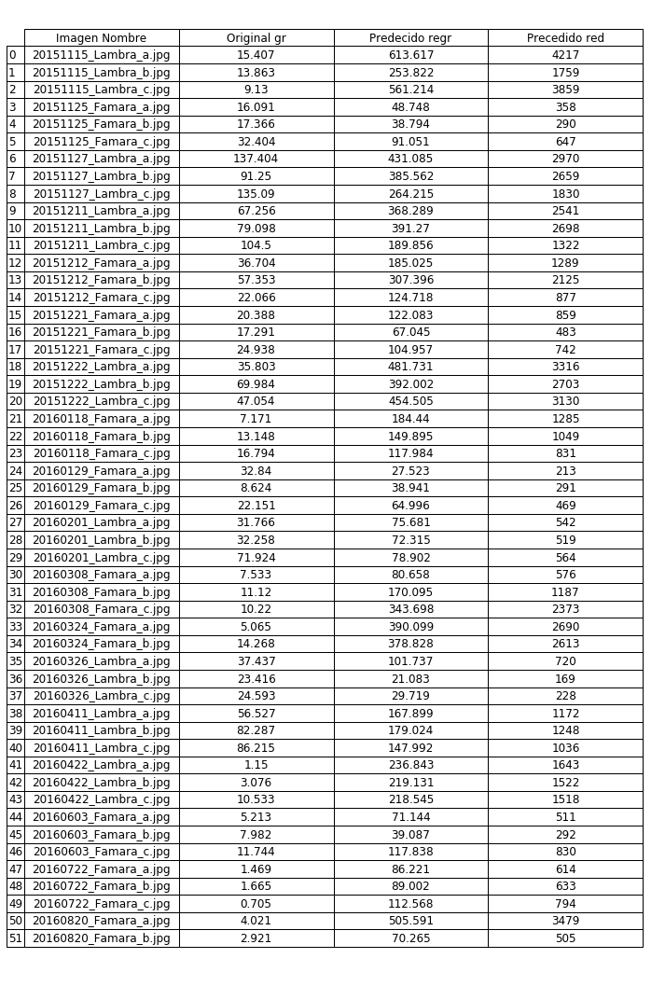

In [87]:
from pandas.plotting import table 

fig, ax = plt.subplots(figsize=(10,15)) # no visible frame

ax.xaxis.set_visible(False)  # hide the x axis
ax.yaxis.set_visible(False)  # hide the y axis
ax.set_frame_on(False)  # no visible frame, uncomment if size is ok
tabla = table(ax, dfResultados.round(3), loc='upper left', 
              colWidths=[0.20]*len(dfResultados.columns),
              cellLoc='center')  
tabla.auto_set_font_size(False) # Activate set fontsize manually
tabla.set_fontsize(12) # if ++fontsize is necessary ++colWidths
tabla.scale(1.2, 1.2) # change size table
plt.tight_layout()
plt.savefig('dfResultados.png', dpi = 300)


Vamos a plasmar el resultado en una gráfica para que se vea la sobrestimación del modelo.

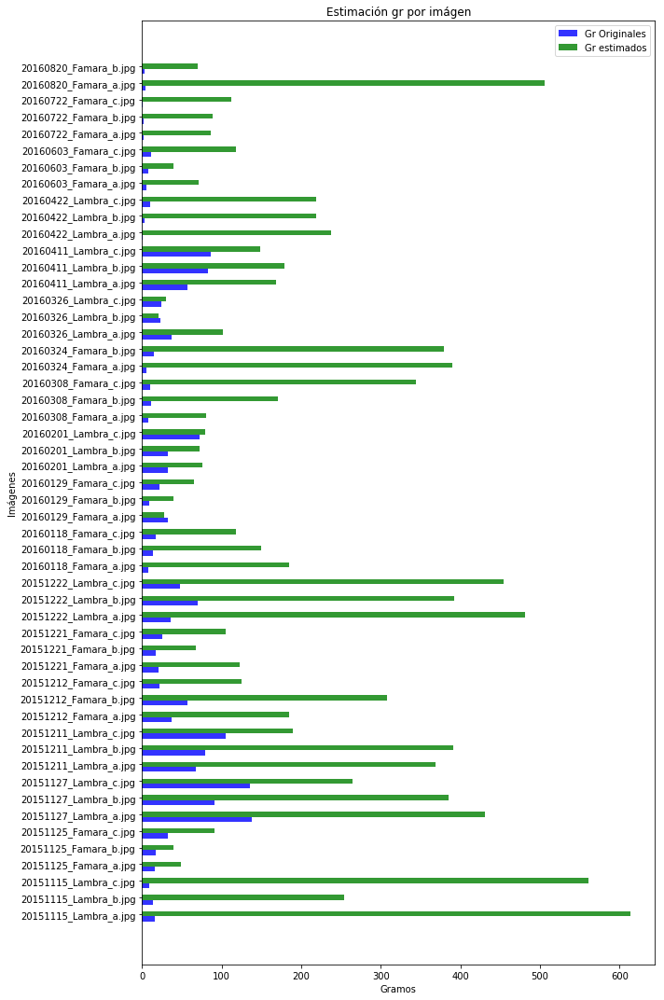

In [53]:

# create plot
fig, ax = plt.subplots(figsize=(10,15))
index = np.arange(len(listImgTest))
bar_width = 0.35
opacity = 0.8

rects1 = plt.barh(index, orig_excel_test, 0.3, align='center',
            alpha=opacity,
            color='b',
            label='Gr Originales')

rects2 = plt.barh(index + 0.3 , eval_regr_test, 0.3, align='center',
            alpha=opacity,
            color='g',
            label='Gr estimados')

plt.xlabel('Gramos')
plt.ylabel('Imágenes')
plt.title('Estimación gr por imágen')
plt.yticks(index + 0.3 , listImgTest)
plt.legend()

plt.tight_layout()
plt.savefig("EstimacionRegresionLineal-32px.jpg")
plt.show()

Realizar gráficos con pandas: https://pandas.pydata.org/pandas-docs/stable/user_guide/visualization.html

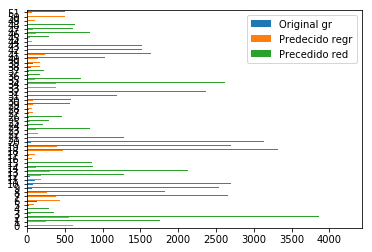

In [56]:
dfResultados.plot.barh()

Matriz de correlación para los resultados estimados

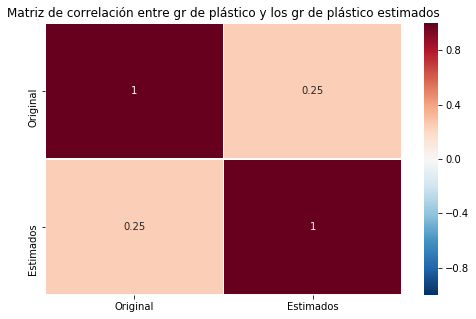

In [90]:
import seaborn as sb

plt.subplots(figsize=(8,5))
plt.title("Matriz de correlación entre gr de plástico y los gr de plástico estimados")
sb.heatmap(np.corrcoef(orig_excel_test,eval_regr_test),vmin=-1, vmax=1, cmap="RdBu_r", annot=True, linewidths=.5,
           xticklabels= ["Original","Estimados"], yticklabels=["Original","Estimados"])

plt.savefig("MatrizCorrelacionGrEstimados-32px.jpg")
plt.show()

Vamos a evaluar individualmente las imágenes: **20160422_Lambra_c.jpg, 20160603_Famara_a.jpg, 0160722_Famara_a.jpg, 20160820_Famara_a.jpg, 20160820_Famara_b.jpg**
Son las que resultados mas extremos dieron.

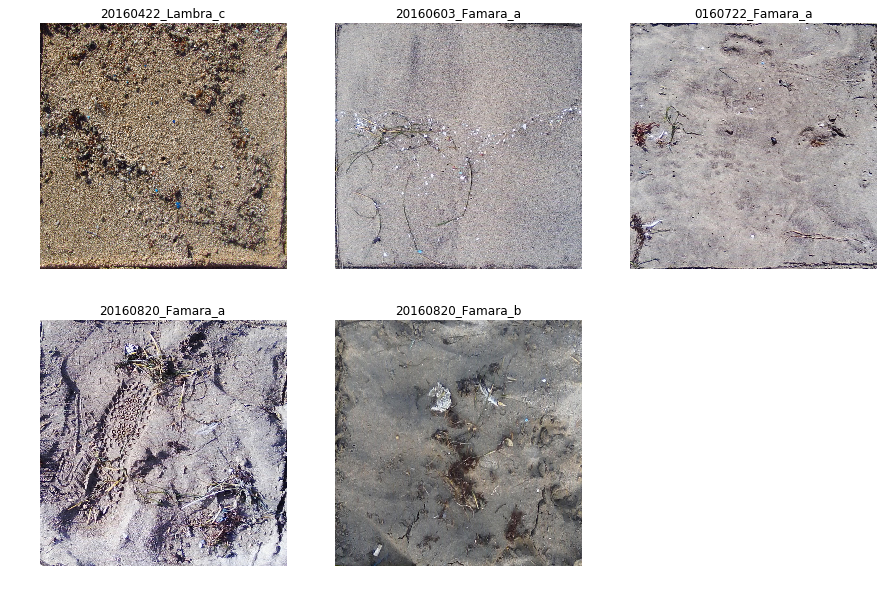

In [91]:
plt.figure(figsize=(15,10))

plt.subplot(231)
plt.axis('off')
plt.title("20160422_Lambra_c")
imagenOriginal = Image.open("MuestrasPrueba (2,3,4-11-17)/Recortada/2240x2240/test/"+"20160422_Lambra_c.jpg")
array = np.array(imagenOriginal)
plt.imshow(array)

plt.subplot(232)
plt.axis('off')
plt.title("20160603_Famara_a")
imagenOriginal = Image.open("MuestrasPrueba (2,3,4-11-17)/Recortada/2240x2240/test/"+"20160603_Famara_a.jpg")
array = np.array(imagenOriginal)
plt.imshow(array)

plt.subplot(233)
plt.axis('off')
plt.title("0160722_Famara_a")
imagenOriginal = Image.open("MuestrasPrueba (2,3,4-11-17)/Recortada/2240x2240/test/"+"20160722_Famara_a.jpg")
array = np.array(imagenOriginal)
plt.imshow(array)

plt.subplot(234)
plt.axis('off')
plt.title("20160820_Famara_a")
imagenOriginal = Image.open("MuestrasPrueba (2,3,4-11-17)/Recortada/2240x2240/test/"+"20160820_Famara_a.jpg")
array = np.array(imagenOriginal)
plt.imshow(array)

plt.subplot(235)
plt.axis('off')
plt.title("20160820_Famara_b")
imagenOriginal = Image.open("MuestrasPrueba (2,3,4-11-17)/Recortada/2240x2240/test/"+"20160820_Famara_b.jpg")
array = np.array(imagenOriginal)
plt.imshow(array)


plt.show()

### Paso 8.5: Visualización de los segmentos que son indicados como plástico

In [93]:
nuevasPruebas = ["20160422_Lambra_c.jpg", "20160603_Famara_a.jpg", "20160722_Famara_a.jpg", "20160820_Famara_a.jpg", "20160820_Famara_b.jpg"]

listNuevasPruebas = lsTestIMG("imgID-"+nuevasPruebas[0],"F:\Microplasticos\MuestrasPrueba (2,3,4-11-17)\Recortada\\2240x2240\TestImg Segmentadas32x32")


In [94]:
arrayNuevasPruebas = np.array([np.array(Image.open("MuestrasPrueba (2,3,4-11-17)/Recortada/2240x2240/TestImg Segmentadas32x32/"+img)) for img in listNuevasPruebas])
arrayNuevasPruebas = arrayNuevasPruebas / 255.0
print(arrayNuevasPruebas.shape)

evalNuevasPruebas =  np.ravel(model.predict(arrayNuevasPruebas))
evalNuevasPruebas = np.asarray([int(round(i)) for i in evalNuevasPruebas])

counterNuevasPruebas = np.count_nonzero(evalNuevasPruebas)
counterNuevasPruebas

(4900, 32, 32, 3)


1518

Se ha comprobado que los resultados de arriba son los que dan como resultado y no hay un desorden en las filas. Ahora vamos a montar la imagen para visualizar los segmentos que ha dectectado como plastico.

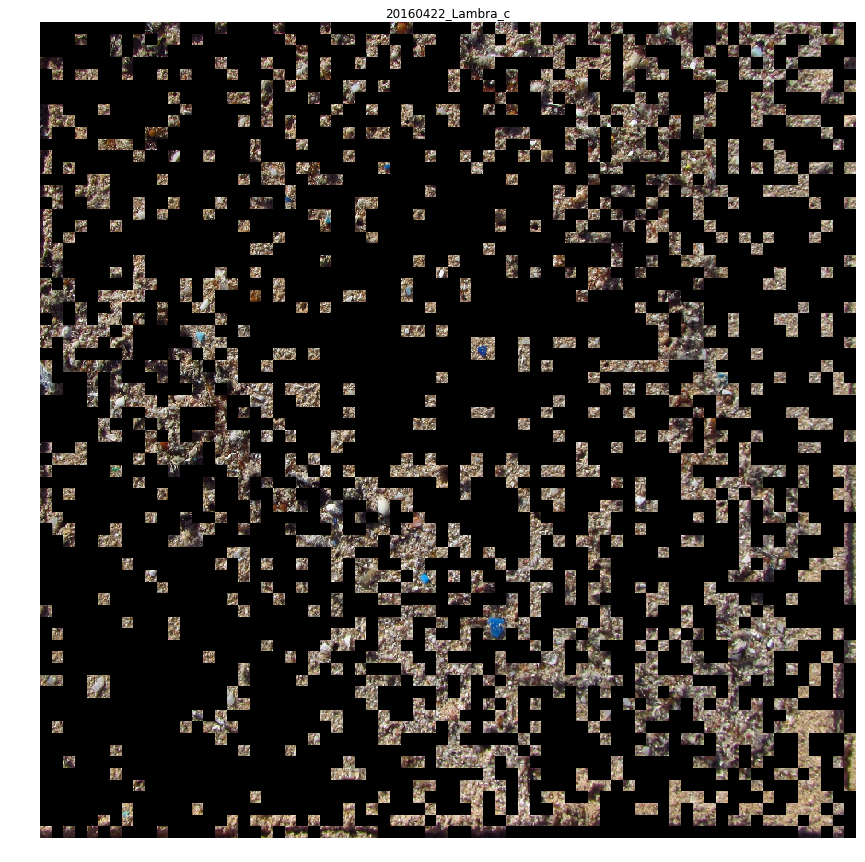

In [99]:
from PIL import Image

n = int(2240/32) #70
            
listVisual = np.asarray(listNuevasPruebas).reshape((n,n))
evalVisual = evalNuevasPruebas.reshape((n, n))
fondo = Image.new('RGBA', (2240, 2240), "black") 
mask = Image.new('RGBA', (2240, 2240), "black") 
blanco = Image.new('RGBA', (32, 32), "white")

for i in range(0,n):
    for j in range(0,n):
        if evalVisual[i][j] == 1:
            imagen = Image.open("MuestrasPrueba (2,3,4-11-17)/Recortada/2240x2240/TestImg Segmentadas32x32/"+listVisual[i][j])
            fondo.paste(imagen,(i*32,j*32))
            mask.paste(blanco,(i*32,j*32))

fondo.save("%s_predict.png" %nuevasPruebas[0][0:-4])
mask.save("%s_mask.png"  %nuevasPruebas[0][0:-4])

plt.figure(figsize=(15,15))
plt.subplot(111)
plt.axis('off')
plt.title("20160422_Lambra_c")
array = np.array(fondo)
plt.imshow(array)

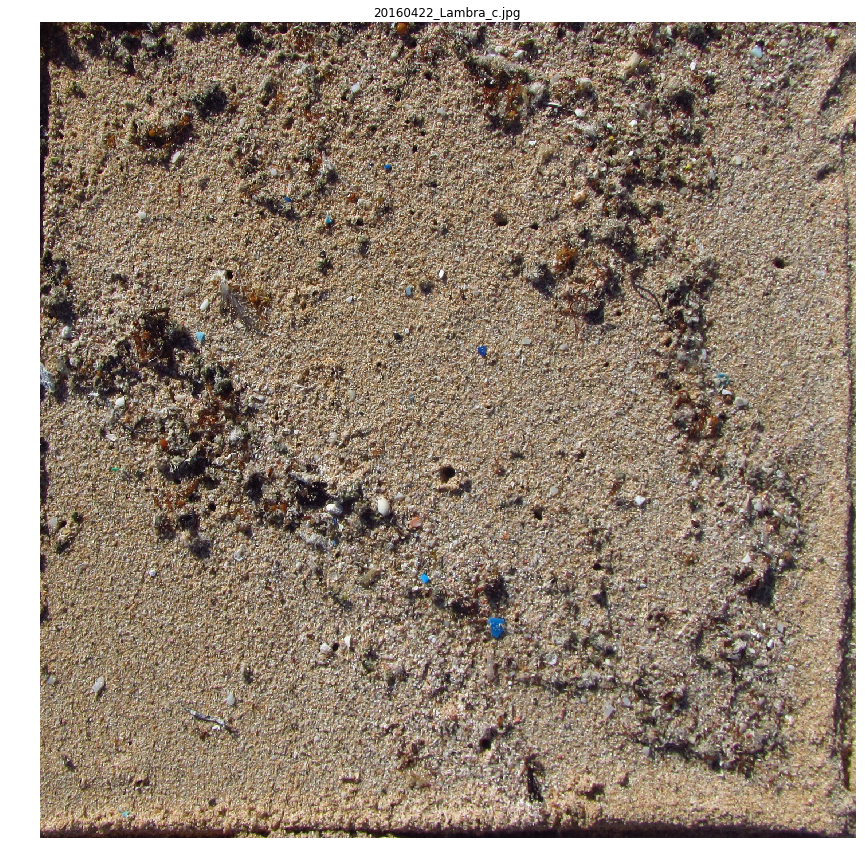

In [284]:
def visualizarImg(imagenPaVer):
    
    plt.figure(figsize=(15,15))

    plt.subplot(111)
    plt.axis('off')
    plt.title(imagenPaVer)
    imagenOriginal = Image.open("MuestrasPrueba (2,3,4-11-17)/Recortada/2240x2240/test/"+imagenPaVer)
    array = np.array(imagenOriginal)
    plt.imshow(array)
    
visualizarImg(nuevasPruebas[0])

In [102]:
def evaluarVisualizarIMG(imagenPaVer):
    listNuevasPruebas = lsTestIMG("imgID-"+imagenPaVer,"F:\Microplasticos\MuestrasPrueba (2,3,4-11-17)\Recortada\\2240x2240\TestImg Segmentadas32x32")
    arrayNuevasPruebas = np.array([np.array(Image.open("MuestrasPrueba (2,3,4-11-17)/Recortada/2240x2240/TestImg Segmentadas32x32/"+img)) for img in listNuevasPruebas])
    arrayNuevasPruebas = arrayNuevasPruebas / 255.0

    evalNuevasPruebas =  np.ravel(model.predict(arrayNuevasPruebas))
    evalNuevasPruebas = np.asarray([int(round(i)) for i in evalNuevasPruebas])

    counterNuevasPruebas = np.count_nonzero(evalNuevasPruebas)

    n = int(2240/32) #70
            
    listVisual = np.asarray(listNuevasPruebas).reshape((n,n))
    evalVisual = evalNuevasPruebas.reshape((n, n))
    fondo = Image.new('RGBA', (2240, 2240), "black") 
    mask = Image.new('RGBA', (2240, 2240), "black") 
    blanco = Image.new('RGBA', (32, 32), "white")

    for i in range(0,n):
        for j in range(0,n):
            if evalVisual[i][j] == 1:
                imagen = Image.open("MuestrasPrueba (2,3,4-11-17)/Recortada/2240x2240/TestImg Segmentadas32x32/"+listVisual[i][j])
                fondo.paste(imagen,(i*32,j*32))
                mask.paste(blanco,(i*32,j*32))
    
    fondo.save("%s_predict.png" %imagenPaVer[0:-4])
    mask.save("%s_mask.png"  %imagenPaVer[0:-4])  
    
    plt.figure(figsize=(15,15))
    plt.subplot(111)
    plt.axis('off')
    plt.title(imagenPaVer)
    array = np.array(fondo)
    plt.imshow(array)

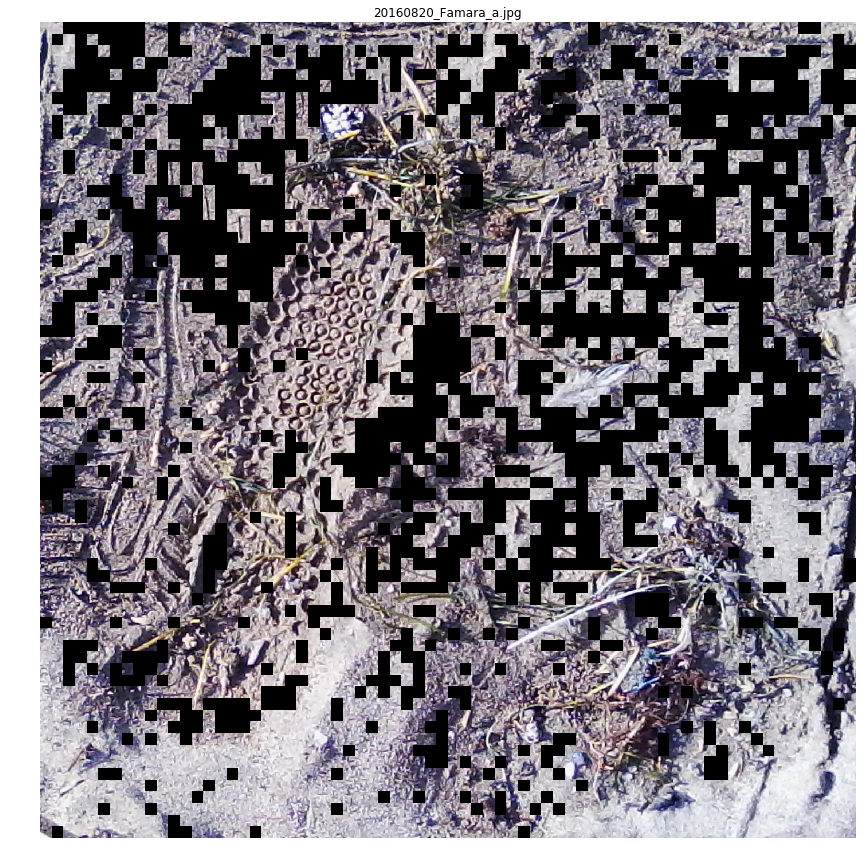

In [104]:
evaluarVisualizarIMG(nuevasPruebas[3])

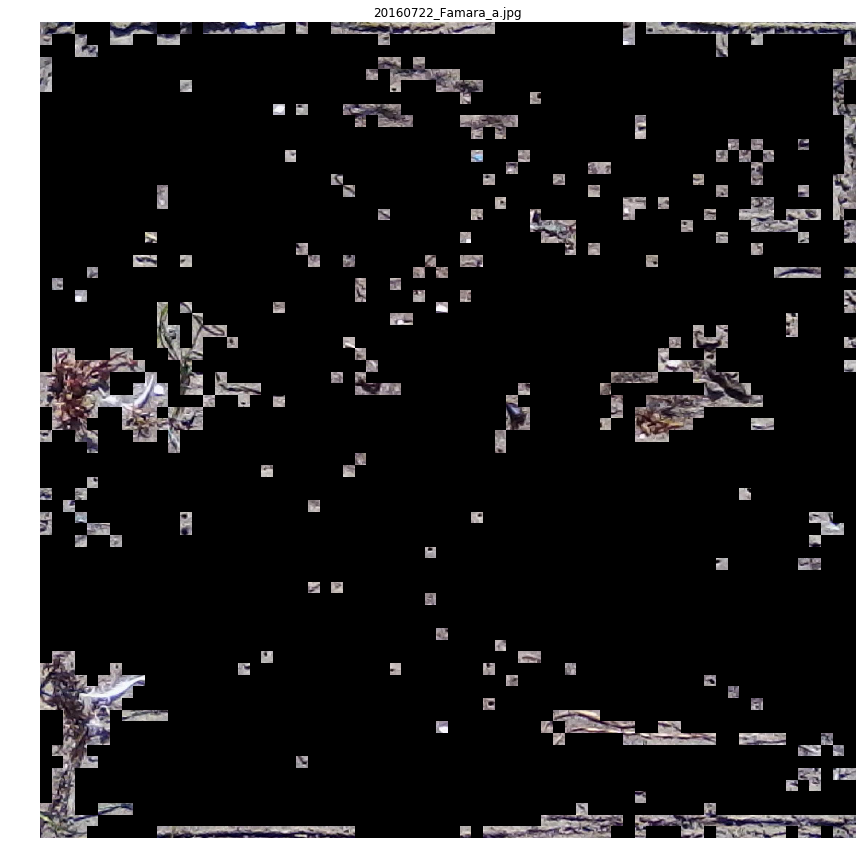

In [105]:
evaluarVisualizarIMG(nuevasPruebas[2])

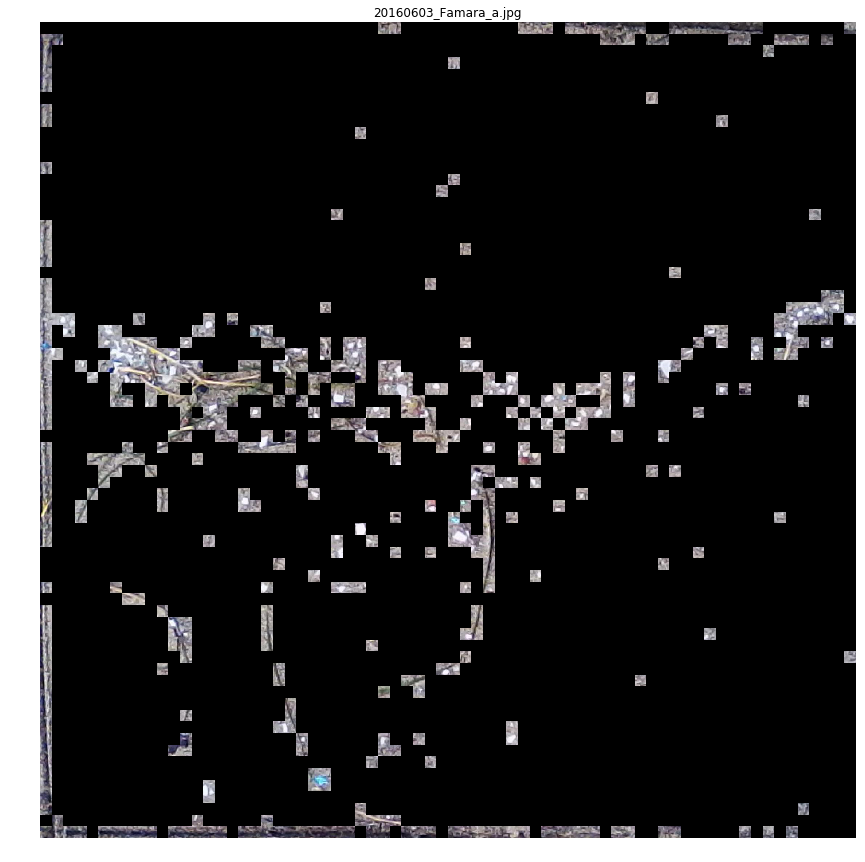

In [103]:
evaluarVisualizarIMG(nuevasPruebas[1])

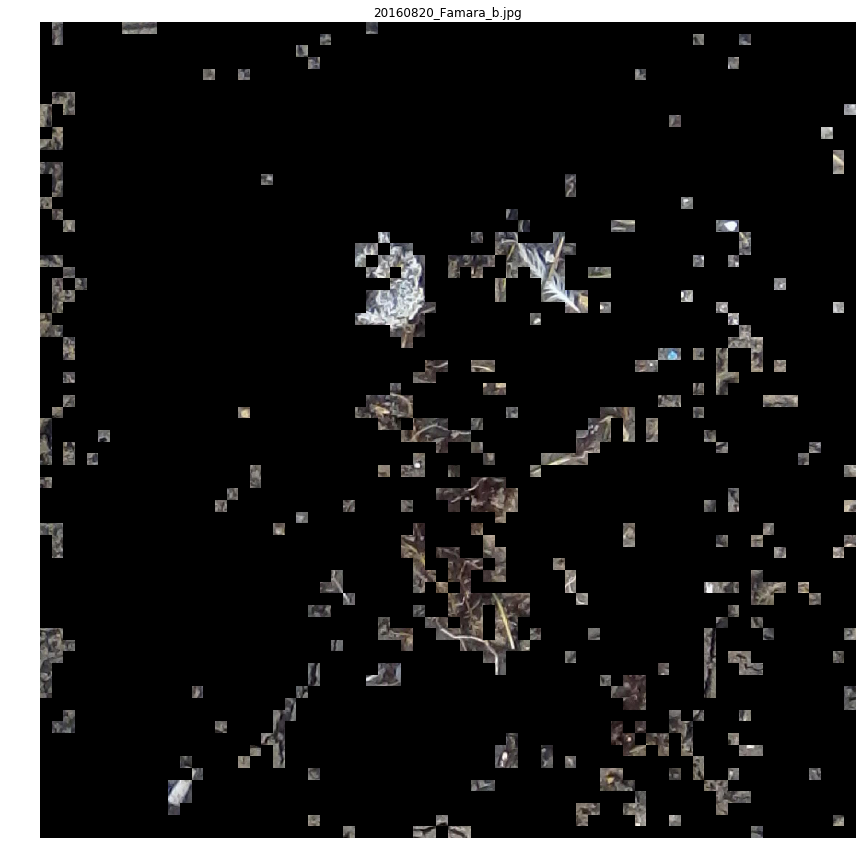

In [106]:
evaluarVisualizarIMG(nuevasPruebas[4])

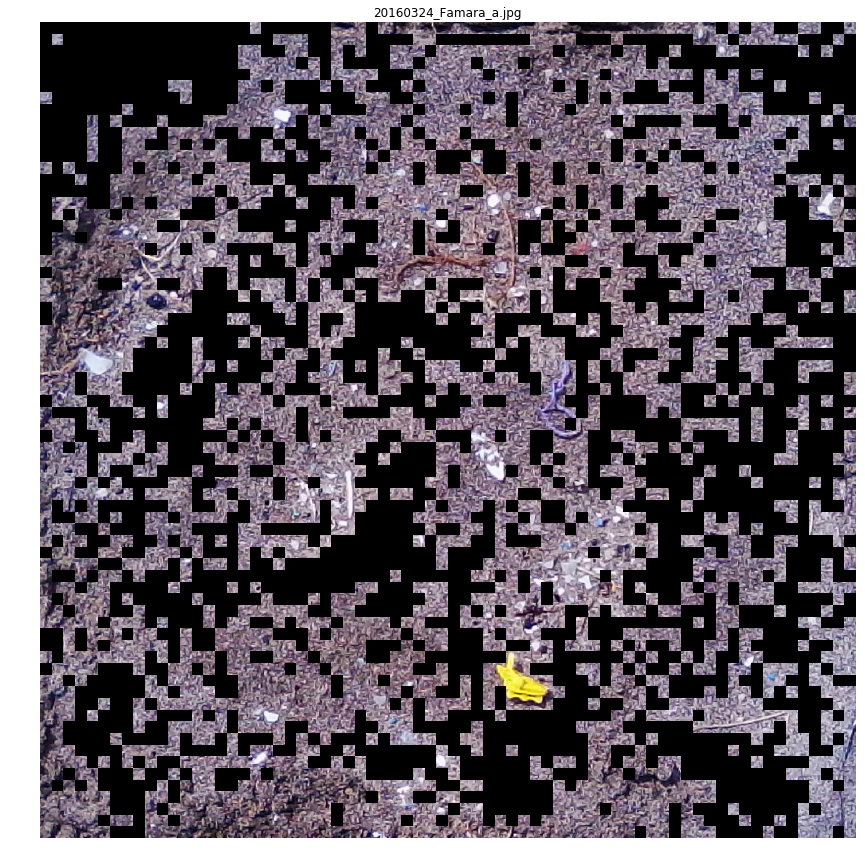

In [108]:
evaluarVisualizarIMG("20160324_Famara_a.jpg")

En esta última imagen podemos observar bastante ruido en la zona de la arena, lo que le dificulta a la red identificar las moléculas de plástico. Si buscamos la imagen sin redimensionar podemos observar que tiene una dimensión de 1155x1155, por lo que podemos afirmar que ese ruido se debe al aumento de resolución que produce una perdida en la calidad de la información. Hay que tener en cuenta que el conjunto de entrenamiento tenia una mayor resolución donde algunas alcanzaban dimensiones de 2498x2498.

Como podemos observar como muchos de los segmentos de plástico del conjunto de entrenamiento son blancos, entonces
en la arena blanca la red se confunde demasiado. La red también tiende a fallar en algas, sombras, pisadas... Esto se debe a que el conjunto de entrenamiento solo consta de 9 muestras donde encontramos únicamente 4 tipos de arena, por lo que, cuando encuentra algo que no sea igual a esos tipos lo clasificará como plástico. 


**Imagenes con buenos resultados para motivar --->**

Esta imagen da buenos resultados segun la tabla


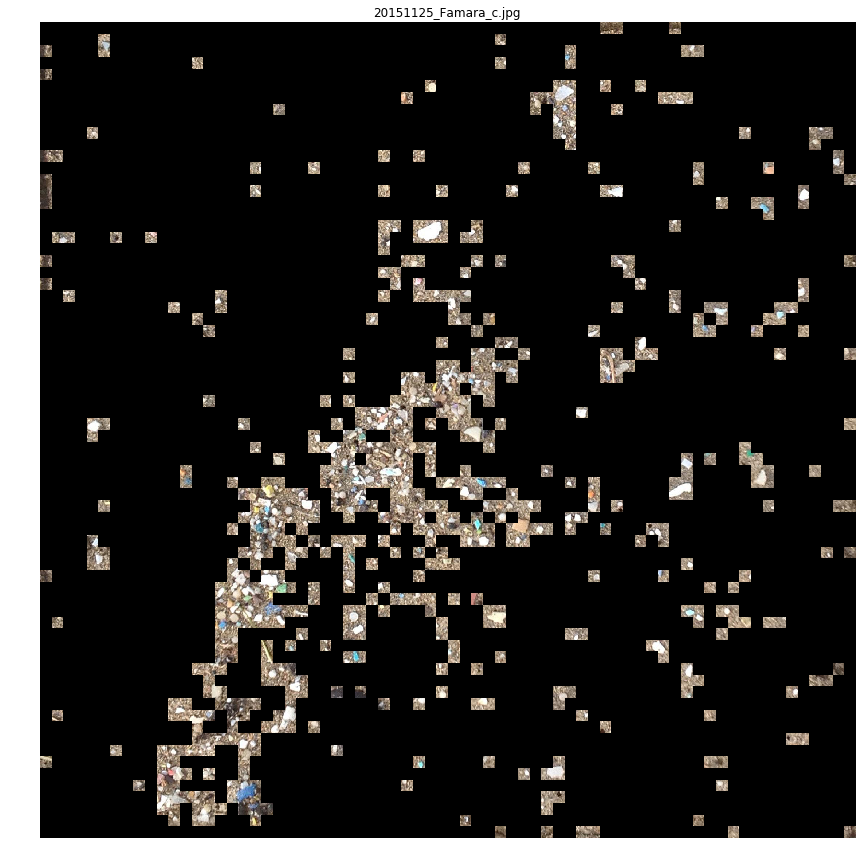

In [107]:
print("Esta imagen da buenos resultados segun la tabla")
evaluarVisualizarIMG("20151125_Famara_c.jpg")

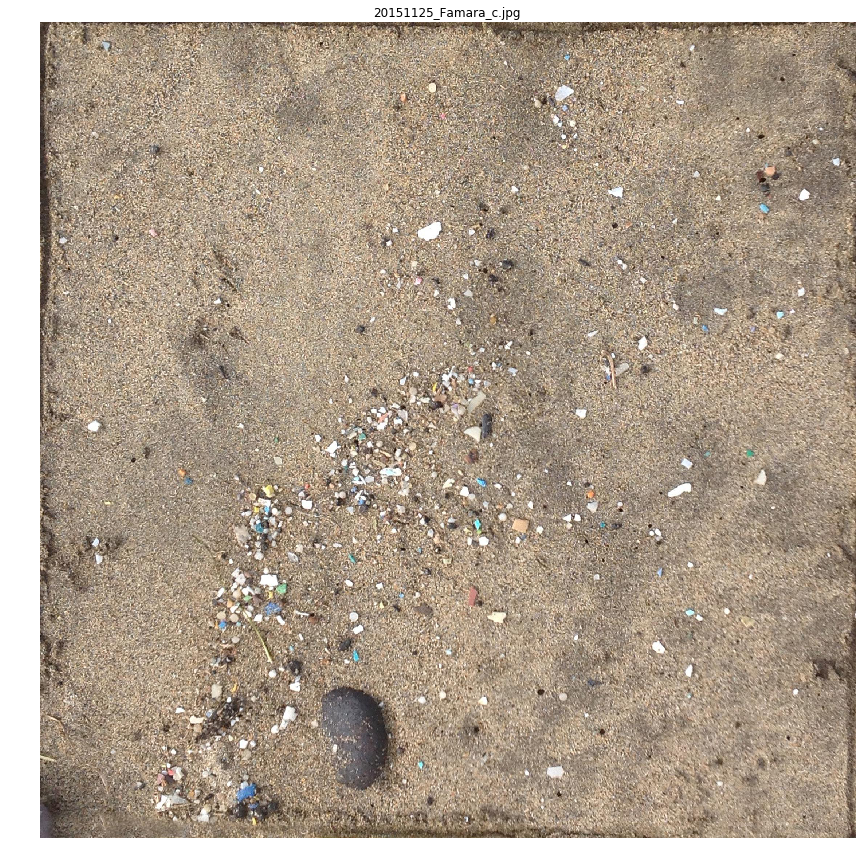

In [285]:
visualizarImg("20151125_Famara_c.jpg")